# "*Natural climate reconstruction in the Stave Churches through time series processing with variational autoencoders*"

**FFPython2**

Noemi Manara 2022909

Lorenzo Rosset 2021859

Francesco Zambelli 2029014

Andrea Zanola 2027588

### Introduction
A Stave church is a medieval wooden Christian church building once common in north-western Europe. Nowadays almost all these buildings are in Norway and they are both tourism destinations and places of worship. Unfortunately, the dramatic change of their internal natural climate due to the presence of visitors and the effect of heating in cold months is threatening the health of these structures. For this reason, people start mobilising to preserve this heritage and studies on the actual conditions of these churches are underway.

A key point is to determine what the historical natural climate of these buildings is in absence of human interventions. The aim of our project is to start from the recorded time series of temperature and humidity of the Ringebu stave church, which are corrupted by the periodic presence of heating and tourists, and to reconstruct the natural time series as they would have been if there were no human activity. To this end, we try to exploit an unsupervised machine learning model called variational autoencoder (VAE).

# **Part 1: Modelling and Dataset preprocessing**

Ringebu church is equipped with three data loggers capable to provide the measure of temperature, humidity and the corresponding timestamp. Two of those sensors, named DL1 and DL2, are positioned inside the building, whereas the third one, DL3, is placed outside in order to record the external climate evolution.

For each data logger, we have a `csv` file with the time series of temperature and humidity in a period of time that goes from April 2019 to April 2020. In addition, we are provided with a metadata file with the information on when the heading has been turned on and off.

In [1]:
#!pip install pandas_bokeh
#!git clone https://github.com/rossetl/Natural-climate-reconstruction-with-VAE.git
#%cd Natural-climate-reconstruction-with-VAE/data
%cd data

/home/lorenzo/Documents/Università/Magistrale/LCP (mod. B)/Project/Natural-climate-reconstruction-with-VAE/data


In [2]:
import datetime
from datetime import timedelta
from math import modf
import numpy as np
import pandas as pd
import pandas_bokeh
import matplotlib.pyplot as plt
from scipy import optimize
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import Legend, CrosshairTool

# Importing datasets and visualization

In [3]:
def prepare_data(fname):
  df_DL=pd.read_csv(fname, names=['U','Date', 'RH', 'T'])
  df_DL=df_DL.drop(df_DL.index[0])  #delete 1° row
  df_DL=df_DL.drop('U', axis=1)     #delete 1° column

  df_DL['Date'] = pd.to_datetime(df_DL['Date'], format='%Y-%m-%d %H:%M:%S')
  df_DL['T']  = pd.to_numeric(df_DL['T'])
  df_DL['RH'] = pd.to_numeric(df_DL['RH'])
  df_DL.loc[:151,'Date']    = df_DL['Date'][:151]    + datetime.timedelta(hours=1)
  df_DL.loc[104972:,'Date'] = df_DL['Date'][104971:] - datetime.timedelta(hours=1)
  return df_DL

def bokeh_plot(title, ylabel, xaxistype, ylim):
  output_notebook()
  pandas_bokeh.output_notebook()
  pd.set_option('plotting.backend', 'pandas_bokeh')
  a = figure(title=title,title_location = "above", plot_width=1000, plot_height=600, 
           x_axis_type=xaxistype, toolbar_location='above',y_range=(ylim[0],ylim[1]))
  
  linked_crosshair = CrosshairTool(dimensions="both")
  a.add_tools(linked_crosshair)
  a.add_layout(Legend(), 'right')
  a.title.text_font_size = '20pt'
  a.xaxis.axis_label_text_font_size = '15pt'
  a.yaxis.axis_label_text_font_size = '15pt'
  a.yaxis.axis_label = ylabel
  a.legend.click_policy="hide"
  return a

In [4]:
# Metadata file
df_metadata=pd.read_csv('Metadata_Ringebu.csv')

start_heat  = pd.to_datetime(df_metadata['Start Heating'].dropna(axis=0), format='%m/%d/%Y %H:%M')
start_event = pd.to_datetime(df_metadata['Start'].dropna(axis=0),         format='%m/%d/%Y %H:%M')
stop_event  = pd.to_datetime(df_metadata['End'].dropna(axis=0),           format='%m/%d/%Y %H:%M')

index  = start_heat.index
index1 = np.setdiff1d(start_event.index,index)
df_metadata.head(3)

,Unnamed: 0,Start,Duration [h],End,Event,People,Start Heating
0,0,4/2/2019 11:00,1.0,4/2/2019 12:00,Funeral,200,4/2/2019 6:00
1,1,4/5/2019 11:00,1.0,4/5/2019 12:00,Funeral,180,4/5/2019 6:00
2,2,4/12/2019 11:00,1.0,4/12/2019 12:00,Funeral,75,4/12/2019 6:00


In [5]:
df_DL1 = prepare_data("Ringebu_DL1_year.csv")
df_DL2 = prepare_data("Ringebu_DL2_year.csv")
df_DL3 = prepare_data("Ringebu_DL3_year.csv")

# Fix legal/solar hour
df_DL1.loc[60633,'Date'] = df_DL1['Date'][60633] + datetime.timedelta(hours=1)
df_DL2.loc[60620,'Date'] = df_DL2['Date'][60620] - datetime.timedelta(hours=1)

# To check that the time interval is 5 min width
#np.unique(df_DL1['Date'].diff().to_numpy())/(60*10**9) #min

## Temperature time series

In [8]:
a = bokeh_plot('Ringebu Temperature [°C]',"T [°C]",'datetime',[-17,37])
a.quad(left=start_event[index1], right=stop_event[index1], bottom=-20, top=40, color="grey",  alpha=0.6, legend_label="Event Heat Off")
a.quad(left=start_heat,          right=stop_event[index],  bottom=-20, top=40, color="black", alpha=0.6, legend_label="Event Heat On")
a.line(df_DL1['Date'], df_DL3['T'], color="blue",  legend_label="DL3_T")
a.line(df_DL1['Date'], df_DL2['T'], color="green", legend_label="DL2_T")
a.line(df_DL1['Date'], df_DL1['T'], color="red",   legend_label="DL1_T")

show(a)

Loading BokehJS ...

Loading BokehJS ...

In [9]:
b = bokeh_plot('Ringebu Rel. Humidity [%]', 'RH [%]','datetime',[5,105])
b.quad(left=start_event[index1], right=stop_event[index1], bottom=0, top=120, color="grey",  alpha=0.6, legend_label="Event Heat Off")
b.quad(left=start_heat,          right=stop_event[index],  bottom=0, top=120, color="black", alpha=0.6, legend_label="Event Heat On")
b.line(df_DL1['Date'], df_DL3['RH'], color="blue",  legend_label="DL3_RH")
b.line(df_DL1['Date'], df_DL2['RH'], color="green", legend_label="DL2_RH")
b.line(df_DL1['Date'], df_DL1['RH'], color="red",   legend_label="DL1_RH")
show(b)

Loading BokehJS ...

Loading BokehJS ...

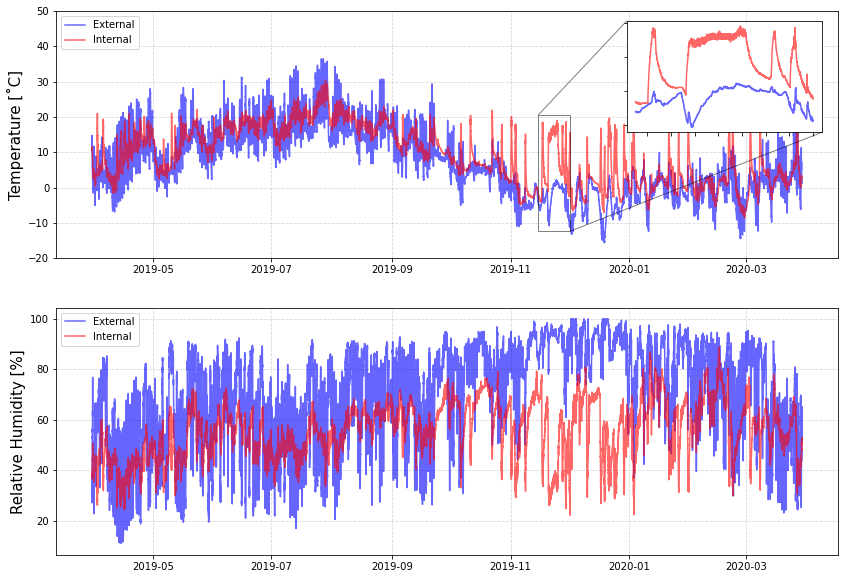

In [10]:
fig, ax = plt.subplots(figsize=(14,10), nrows=2, ncols=1)
ax[0].set_ylabel('Temperature [˚C]', size=15)
ax[0].plot(df_DL3.Date, df_DL3['T'], label='External', c='blue', alpha=0.6)
ax[0].plot(df_DL1.Date, df_DL1['T'], label='Internal', c='red', alpha=0.6)
ax[0].legend(loc='upper left')
ax[0].grid(ls='dashed', alpha=0.5)
ax[0].set_ylim([-20, 50])
axins = ax[0].inset_axes([0.73, 0.51, 0.25, 0.45])
ins_mask = (df_DL1.Date < '2019-12-01 00:00') & (df_DL1.Date > '2019-11-16 00:00')
axins.plot(df_DL3.Date[ins_mask], df_DL3['T'][ins_mask], c='blue', alpha=0.6)
axins.plot(df_DL1.Date[ins_mask], df_DL1['T'][ins_mask], c='red', alpha=0.6)
axins.set_xticklabels('')
axins.set_yticklabels('')
ax[0].indicate_inset_zoom(axins, edgecolor="black")


ax[1].set_ylabel('Relative Humidity [%]', size=15)
ax[1].plot(df_DL3.Date, df_DL3['RH'], label='External', c='blue', alpha=0.6)
ax[1].plot(df_DL1.Date, df_DL1['RH'], label='Internal', c='red', alpha=0.6)
ax[1].legend(loc='best')
ax[1].grid(ls='dashed', alpha=0.5)

# Corruption Level

The first thing we want to do is to figure out what is the corruption percentage level of our dataset, i.e. the ratio between the total time in which the heating was turned on and the whole observation time of the series
$$corr_{\%}=\frac{\Delta t_{heat}}{\Delta t_{set}}*100$$

In [11]:
corr=100*np.sum(stop_event[index]-start_heat)/(df_DL1['Date'].iloc[-1]-df_DL1['Date'].iloc[0])
print('Corruption Level:', np.round(corr,2), '%')

Corruption Level: 3.35 %


This simple estimate is way far from reality, though. The reason is that the thermal inertia of the building makes the heating effect acting on the natural climate for a certain amount of time after the heating is turned off. We want to quantify this effect.

The temperature evolution of a body in thermal contact with a reservoir at temperaure $T_{env}$ can be described by the *Newton's law of heat*
$$\dot{T}(t) =\frac{1}{\tau}\bigl(T_{env}(t)-T(t)\bigr).$$
If we assume that the temperature of the reservoir is constant, i.e. $T_{env}(t)=T_{env} = const.$, the solution of the differential equation is
$$\Delta T(t) = \Delta T_{0}~e^{−\frac{t}{\tau}}.$$

If we take into account that the internal temperature will never reach the external one, we can think to estimate the characteristic time $\tau$ by fitting our data in a region where $T_{DL3} \simeq const.$ with the model

$$\Delta T(t) = \Delta T_{0} e^{−\frac{t}{\tau}}+T_{offset}$$

In [12]:
def sim_NL (start, stop, df, df_real, lim):
  l = df['T'][df['Date']==start].index[0]
  u = df['T'][df['Date']==stop ].index[0]

  lr = df_real['T'][df_real['Date']==start].index[0]  
  ur = df_real['T'][df_real['Date']==stop ].index[0]

  DT = (df['Date'][u]-df['Date'][l]).total_seconds()
  dt = (df['Date'][2]-df['Date'][1]).total_seconds()
  x = np.arange(0, DT, dt)
  y = np.array([df['T'][l:u]])[0]

  def f(x, K, tau, c):
    f = K*np.exp(-x/tau)+c
    return f
  G = optimize.curve_fit(f, x/3600, y, p0=[17, 14, 4])

  plt.figure(figsize=(12,6))
  plt.title('Simulated Newton Law', size=15)
  plt.ylabel('T [°C]', size=15)
  #plt.xlim(lim)
  plt.scatter(df['Date'][l:u], df['T'][l:u], c='black', label='DL1_T', s=2)
  plt.scatter(df_real['Date'][lr:ur], df_real['T'][lr:ur], c='gray', label='DL3_T', s=2)

  c = pd.to_datetime(df['Date'])[l] # [ms]
  yy = f(x/3600, G[0][0], G[0][1], G[0][2])

  plt.plot(df['Date'][l:u], np.ones(len(x))*np.mean(df_real['T'][lr:ur]), c='blue', label='DL3_T mean')
  plt.plot(df_real['Date'][lr:ur], yy, c='red', label='Fit')
  plt.legend(fontsize=12)
  plt.show()

  print('---Fit Parameters---')
  print('T0  = %.2f'%G[0][0],'+- %.2f'%G[1][0,0]**0.5, '[°C]')
  print('tau = %.2f'%G[0][1],'+- %.2f'%G[1][1,1]**0.5, '[h]')
  print('Ts  = %.3f'%G[0][2],'+- %.2f'%G[1][2,2]**0.5, '[°C]')
  return G

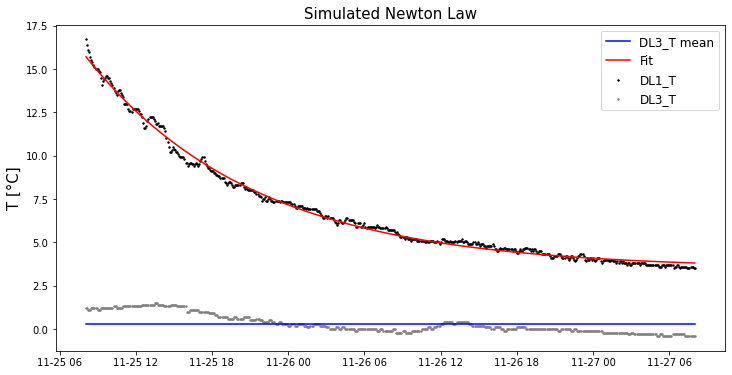

---Fit Parameters---
T0  = 12.22 +- 0.04 [°C]
tau = 13.27 +- 0.11 [h]
Ts  = 3.477 +- 0.03 [°C]


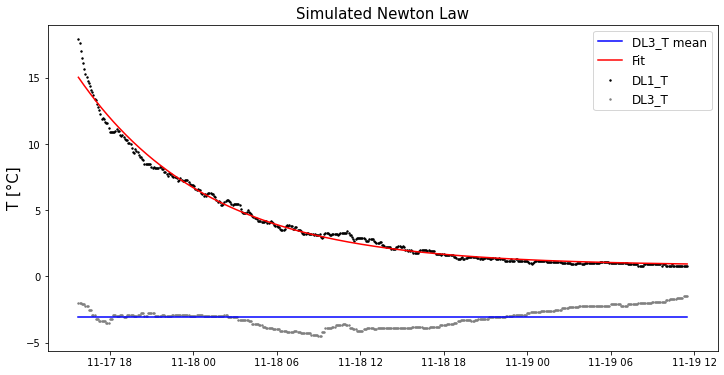

---Fit Parameters---
T0  = 14.23 +- 0.07 [°C]
tau = 9.36 +- 0.10 [h]
Ts  = 0.808 +- 0.03 [°C]


In [13]:
start= "2019-11-25 08:00:00"
stop = "2019-11-27 08:00:00"
pfit1 = sim_NL(start, stop, df_DL1, df_DL3,[-1,18])

start= "2019-11-17 15:40:00"
stop = "2019-11-19 11:30:00"
pfit2 = sim_NL(start, stop, df_DL1, df_DL3,[-5,20])

Clearly, this is just a rough estimate of $\tau$, whereas the real model is much more complicated and the external temperature, in general, is not constant. However, this simple analysis tells us that the actual corruption level is much higher than the naive estimate we made at the beginning. A safer approach could be to cut at least $2\tau$ hours after the heating is declared to be turned off. 

If we take the first value of $\tau$ from the two fits above, the new corruption level is:

In [ ]:
tau=int(np.trunc(pfit1[0][1]*60*60*10**3))
taut= timedelta(milliseconds=tau)
ntau=2
corr_new=100*np.sum(stop_event[index]+ntau*taut-start_heat)/(df_DL1['Date'].iloc[-1]-df_DL1['Date'].iloc[0])
print('New Corruption Level:', np.round(corr_new,2), '%')

New Corruption Level: 13.33 %


If we consider only autumn and winter the corruption level is instead:

In [ ]:
start= "2019-09-22 00:00:00" #start autmun
stop = "2020-03-20 00:00:00" #end winter
delta_tot = df_DL1['Date'].iloc[df_DL1['Date'][df_DL1['Date']==stop].index[0]]-df_DL1['Date'].iloc[df_DL1['Date'][df_DL1['Date']==start].index[0]]
corr_new_aw=100*np.sum(stop_event[index]+ntau*taut-start_heat)/delta_tot
print('New Corruption Level Autmun-Winter:', np.round(corr_new_aw,2), '%')

New Corruption Level Autmun-Winter: 27.06 %


From the discussion above, it seems clear that the training of a data starving model as a VAE is unfeasible with such a corrupted data set. In other words, we don't have enough *good data samples* to feed the VAE in order for it to be able to generate some natural-like time series.

The need for more data led us considering to use some series recorded by weather forecast stations close to the Ringebu stave church. In particular, we wonder if there is some sort of *transfer function* able to map an external time series in something that resembles what we would measure inside the church. If we succeed in doing this, then we can think to train the VAE with these pseudo-synthetic data. Eventually, we can feed it with the original time series to get in output something cleaner.

In the following section, we start exploring this possibility.

# Transfer Function

If we compare the external time series of temperature, DL3, with one of the internal ones, say DL1, we can see that the latter seems to be approximatively a rescaled and delayed version of the former.

![title](https://github.com/rossetl/Natural-climate-reconstruction-with-VAE/blob/main/Images/heat_wave.png?raw=true)

FFT

First of all, we look at the power spectrum of our signals. This will tell us which are the dominating frequencies of the process. We can already guess that they will correspond to the year's and day's periodicity, since the main change in temperature is devoted to the season and the day-night cycle.

In [16]:
#code from http://www.fis.unical.it/astroplasmi/primavera/dottorato/Analisi_di_Fourier.html

def reconstruct(ak, n):
    Nyq = len(ak) - 1         # Nyquist frequency
    Ns = 2 * Nyq             # Number of points in the output vector
    sr = np.zeros(Ns)        # Output vector
    if n > Nyq:
        print("Error! The number of harmonics for the reconstruction must be smaller than the Nyquist frequency of the signal!")
        return sr
    else:
        akk = np.zeros(Nyq+1, dtype=complex)
        akk[:n+1] = ak[:n+1]
        sr = np.fft.irfft(akk)
    return sr

def spettro(f):
    N = len(f)                       # Length of the starting vector
    Nf = int( N / 2 )                # Nyquist frequency
    om = np.linspace(0.0, Nf, Nf+1)  # Output vector with frequencies
    sp = np.zeros(Nf+1)              # Output vector with the power spectrum
    ak = np.fft.rfft(f) / N          # Transformed input vector (normalized)
    for n in range(Nf+1):
        if n == 0:
            sp[n] = np.square(np.abs(ak[n]))
        else:
            sp[n] = 2.0 * np.square(np.abs(ak[n]))
    return om, sp

def location(df, start, stop):
  data_inf = df['T'][df['Date']==start].index[0]
  data_sup = df['T'][df['Date']== stop].index[0]
  return data_inf, data_sup

def FFT_func(df, data_inf, data_sup, n_freq, line=False):
  dy = np.array(df['T'][data_inf:data_sup])
  mean_dy = np.mean(dy)
  d = len(dy)
  dT = int((df['Date'].iloc[data_sup]-df['Date'].iloc[data_inf]).total_seconds())
  c = (pd.to_datetime(df['Date']).astype(int)/ 10**6)[data_inf]
  t = np.linspace(0,dT,d)*2*np.pi

  def f(x,a,b):
      f=a+b*x
      return f
  G = optimize.curve_fit(f, t, dy, p0=[dy[0],-0.1])

  yline = G[0][0]+G[0][1]*t
  if line == True:
      ak = np.fft.rfft(dy-yline)            # Fourier coefficients computation
  else:
      ak = np.fft.rfft(dy-mean_dy)          # Fourier coefficients computation

  sr3 = reconstruct(ak,n_freq)

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,7))
  fig.tight_layout(pad=4.0)

  w, Ew = spettro(dy-yline)
  d = pd.DataFrame({'w': w, 'Ew': Ew})
  d = d.sort_values(by=['Ew'],ascending=False)
  d = d.reset_index(drop=True)
  wf=np.array(d['w'][:nfreq])
  Ef=np.array(d['Ew'][:nfreq])
  tdy=dT/(60*60*24*wf)

  ax1.set_title("Power Spectrum")
  ax1.set_xlabel(r"$\omega$")
  ax1.set_xscale('log')
  ax1.set_yscale('log')
  ax1.set_ylabel(r"E($\omega$)")
  ax1.plot(w,Ew,'k', label="E($\omega$)")
  ax1.scatter(wf,Ef,color='red',s=10,label="Highet Freq.")
  ax1.set_ylim(10**-11,10**2)
  ax1.legend()

  tit='FFT Rebuilt with '+str(n_freq)+' frequencies'
  ax2.set_title(tit)
  ax2.plot(t/(60*60), dy,'blue', label="Data")
  if line==True: 
      ax2.plot(t/(60*60), sr3+yline, 'orange', label="FFT Rebuilt")
      ax2.plot(t/(60*60), yline, '--', color='orange', label="Baseline")
      yline1=yline
  else:
      yline1= mean_dy*np.ones(len(t))
      ax2.plot(t/(60*60), sr3+mean_dy, 'orange', label="FFT Rebuilt")
      ax2.plot(t/(60*60), yline1, '--', color='orange', label="Baseline")
  
  ax2.set_xlabel('t [h]')
  ax2.set_ylabel('T [°C]')
  ax2.legend()
  plt.show()

  return t*1000/(2*np.pi)+c, sr3, yline1, tdy

We start by analyzing some brief and *safe* periods of time, in which we are confident to observe the natural behaviour of temperature

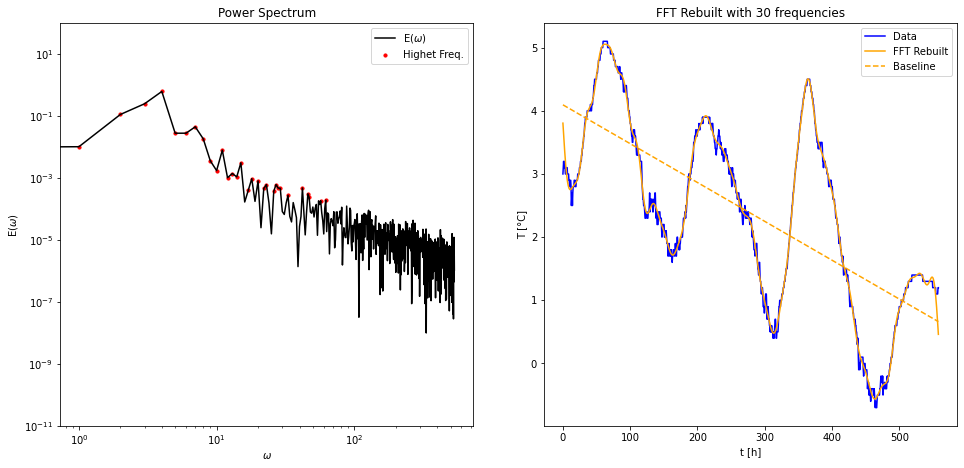

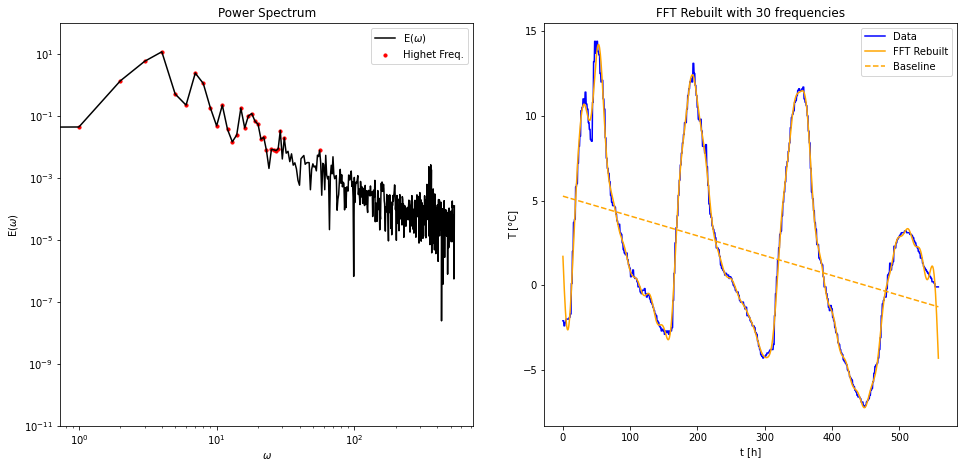

In [17]:
nfreq = 30
start = "2020-03-19 07:10:00"
stop  = "2020-03-23 00:00:00"
data_inf1, data_sup1 = location(df_DL1, start, stop)
tin, yin, ylinein, Tin = FFT_func(df_DL1, data_inf1, data_sup1, nfreq, True)

tout3, yout3, ylineout3, Tout_3 = FFT_func(df_DL3, data_inf1, data_sup1, nfreq, True)

## $T_{in}$ Reconstruction

We retain just the first top 30 frequencies in such a way to get a smoother signal without losing much information. After this procedure, it becomes easy to spot the various maxima and minima of the signal and calculate the attenuation $F_{att}$ and the time shift $t_{shift}$.

$$F_{att}=\frac{T_{DL1,max}-T_{DL1,min}}{T_{DL3,max}-T_{DL3,min}}$$

$$t_{shift}=t_{DL3,max}-t_{DL1,max}$$

We can afterwards average the sets $\{F_{att,i}\}$ and $\{t_{shift,i}\}$, where $i$ is the maximum/minimum index, get an idea of the magnitude of these parameters.

In [18]:
#yin
array = yin + ylinein
max1 = (array[1:-1] > array[:-2]) & (array[1:-1] > array[2:])
min1 = (array[1:-1] < array[:-2]) & (array[1:-1] < array[2:])

#yout
array2 = yout3 + ylineout3
max2 = (array2[1:-1] > array2[:-2]) & (array2[1:-1] > array2[2:])
min2 = (array2[1:-1] < array2[:-2]) & (array2[1:-1] < array2[2:])

#df_DL3
time_delay_min3=tin[1:-1][min1][np.array([0,2,3,4])]-tout3[1:-1][min2][np.array([0,4,5,6])]
time_delay_max3=tin[1:-1][max1][np.array([0,2,3,4])]-tout3[1:-1][max2][np.array([1,4,5,6])]

A3 = np.round(np.mean(time_delay_min3)/(1000*60*60),2)
B3 = np.round(np.mean(time_delay_max3)/(1000*60*60),2)
S3 = np.mean(np.array([time_delay_min3,time_delay_max3]))/(1000*60*60)
print('Time Delay on min T:', A3,'h')
print('Time Delay on max T:', B3,'h')
print('Shift S:', np.round(S3,2), 'h')

A3 = np.round(np.max(yout3)-np.min(yout3),2)
B3 = np.round(np.max(yin)-np.min(yin),2)
Fa3 = (np.max(yin)-np.min(yin))/(np.max(yout3)-np.min(yout3))
print('Max T Dispersion Out:', A3,'°C')
print('Max T Dispersion Ins:', B3,'°C')
print('Attenuation Fa:',np.round(Fa3,2) )

Time Delay on min T: 1.48 h
Time Delay on max T: 2.21 h
Shift S: 1.85 h
Max T Dispersion Out: 18.2 °C
Max T Dispersion Ins: 4.46 °C
Attenuation Fa: 0.25


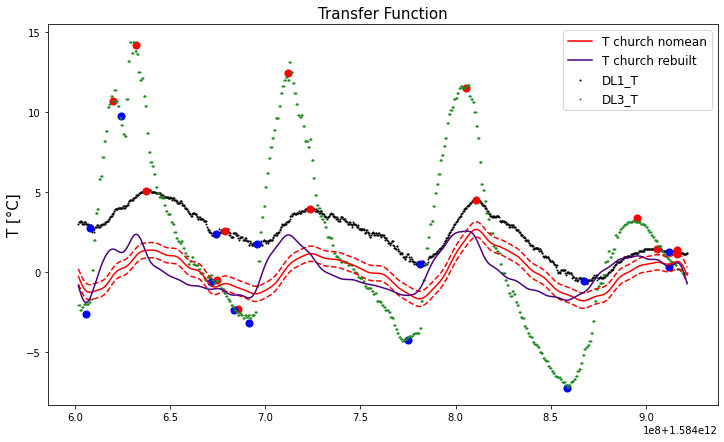

In [19]:
plt.figure(figsize=(12, 7))
plt.title('Transfer Function', size=15)
plt.ylabel('T [°C]', size=15)

# T church: DL1
plt.scatter(tin, df_DL1['T'][data_inf1:data_sup1], c='black', label='DL1_T', s=1)
plt.scatter(tin[1:-1][max1], array[1:-1][max1], c='red', s=50)
plt.scatter(tin[1:-1][min1], array[1:-1][min1], c='blue', s=50)

# T outside: DL3
plt.scatter(tout3[1:-1][max2], array2[1:-1][max2], c='red', s=50)
plt.scatter(tout3[1:-1][min2],array2[1:-1][min2], c='blue', s=50)
plt.scatter(tin, df_DL3['T'][data_inf1:data_sup1], c='forestgreen', label='DL3_T', s=1)

# Lines
#plt.plot(tin, ylinein, c="orangered", label="DL1_T trend", ls="dashed")
#plt.plot(tout3, ylineout3, c="mediumpurple", label="DL3_T trend", ls="dashed")

#Uncertainties
accuracy=0.4
digit=1
resolution=0.1
n_sig=2
sig=((accuracy)**2+(digit*resolution)**2)**0.5 /np.sqrt(3)

# T rebuilt     
plt.plot(tin, yin, c="red", label="T church nomean")
plt.plot(tin, yin + n_sig*sig, c='red', ls='dashed')
plt.plot(tin, yin - n_sig*sig, c='red', ls='dashed')
fraz, pint1 = modf(S3)
fraz, pint2 = modf(fraz*60)
fraz, pint3 = modf(fraz*60)
c=(pint1*3600+pint2*60+pint3)
plt.plot(tout3+c, yout3*Fa3, c="indigo", label="T church rebuilt")

plt.legend(loc='best', fontsize=12);

Where the uncertainties on the data logger measurements were taken from the datasheet of the instrument:

**Sensors TESTO 175H1**

Temperature
- Capacitive Measuring range: -20 to +55 °C
- Accuracy: ±0.4 °C (-20 to +55 °C) ±1 Digit
- Resolution: 0.1 °C

Humidity 
- Capacitive Measuring range: 0 to 100 %rH*
- Accuracy: ±2 %RH (2 to 98 %RH) at +25 °C / < ±1 %RH / year drift at +25 °C
- Resolution: 0.1 %rH  ***

https://www.testo.com/en-US/testo-175h1/p/0572-1754

# Prepare training data set

Now that we've seen that this simple idea seems to work, we have to import and manipulate the time-series taken from the stations, as we anticipated before. These weather data can be found at the link https://seklima.met.no/observations/

The station we selected for our analysis, **E6 Frya**, has the following geographic information

*   Municipality: Ringebu
*   County: Innlandet
*   Station number (id): SN13390
*   Height above mean sea level: 185 m

| Quantity | $\Delta t$ | Operative Window |
| --- | --- | --- |
| Air Temperature $T$          | 10 min | 17-09-2014 - operative |
| Relative Air Humidity $RH$   | 10 min | 17-09-2014 - operative |
| Dew Point Temperature $T_{d}$| 10 min | 23-10-2015 - operative |

Here below we show also where this station is with respect to Ringebu. The distance between each other is 5.3 km and they are practically at the same h.s.l

![Frya](https://github.com/rossetl/Natural-climate-reconstruction-with-VAE/blob/main/Images/frya.png?raw=true)

## Station data preprocessing

The station's data sets consist of one-year-range time series of external temperature and relative humidity of the air. In these files, we have data coming from three different stations close to Ringebu, but we chose to focus on just one: the Frya's station. In the following section, we import the data for the year 2019-2020 - the period we are interested in - and we compare it with the data logger data of the church. The aim is to determine the effective transfer function to apply to the station's time series in order to get something that resembles an uncorrupted series for the internal climate of the church. The idea is therefore the same applied before.

The first thing to do is to accommodate the station's data to the Ringebu ones. We therefore create a suitable dataframe with the features of interest and we stick the missing rows (station' series have data every 10 minutes, but we need a row every 5 minutes) obtained by interpolation. 

In [20]:
def get_Ringebu_dataframe(fname):
    df = pd.read_csv(fname).iloc[:, 1:4]
    df.Data = pd.to_datetime(df.Data, format="%Y-%m-%d %H:%M:%S")
    df.columns = ["date", "humidity", "temperature"]
    df.set_index("date", inplace=True)
    df.humidity = pd.to_numeric(df.humidity, downcast="float")
    df.temperature = pd.to_numeric(df.temperature, downcast="float")
    return df

def get_station_dataframe(fname, period, station):
    df = pd.read_csv(fname, delimiter=';', names=['station', 'name', 'date', 'temperature', 'humidity'])
    df = df.loc[df["station"] == station]
    df = df.drop([df.index[0], df.index[-1]]) #delete first and last rows
    df = df.drop(['name', 'station'], axis=1)     #delete 1° column
    df['date'] = pd.to_datetime(df['date'], format='%d.%m.%Y %H:%M')
    df = df.drop(df.index[df["temperature"] == "-"]) # Remove missing values of temperature
    df['temperature'] = pd.to_numeric(df['temperature'], downcast="float")
    df = df.drop(df.index[df["humidity"] == "-"]) # Remove missing values of humidity
    df['humidity'] = pd.to_numeric(df['humidity'], downcast="float")
    df.set_index("date", inplace=True)
    df = df.drop(df.index[df.index < period[0]])
    df = df.drop(df.index[df.index > period[1]])
    df = df.reindex(columns=["humidity", "temperature"])
    return df

def fill_holes(St, period):
    """Function for filling holes in datsets and put a row every
    5 minutes, from period[0] to period[1]"""
    dates = pd.date_range(period[0], period[1], freq="5min")
    mask = ~ dates.isin(St.index)
    missing = dates[mask]
    df = pd.DataFrame(index=missing, data={"humidity" : None, "temperature" : None})
    ndf = St.append(df).sort_index().interpolate(method="time", limit_direction="both")
    ndf.iloc[0] = ndf.iloc[1] # Otherwise we get NaN at the first position
    return ndf

In [21]:
dl1 = get_Ringebu_dataframe("Ringebu_DL1_year.csv")
dl2 = get_Ringebu_dataframe("Ringebu_DL2_year.csv")
dl3 = get_Ringebu_dataframe("Ringebu_DL3_year.csv")

dl1.head(3)

,humidity,temperature
date,,
2019-03-30 13:25:00,38.900002,11.6
2019-03-30 13:30:00,38.900002,11.6
2019-03-30 13:35:00,38.900002,11.6


We denote with `dl3r` the temperature time series taken from the station. The *r* stands for *real* since from the comparison with DL3 we noticed that the latter seems to be systematically higher. One hypothesis can be that the sensor is placed on the walls of the church, and hence is affected by the internal temperature. Another possibility is that E6Frya is located on the north face of the mountain.

In [22]:
period = [dl1.index[0], dl1.index[-1]]
station_fname = "Ringebu_stations_data/Ringebu_2019-2020.csv"
dl3r = get_station_dataframe(station_fname, period, "E6 Frya")
dl3r = fill_holes(dl3r, period)
dl1 = fill_holes(dl1, period)
dl2 = fill_holes(dl2, period)
dl3 = fill_holes(dl3, period)
dl3r.head(3)

,humidity,temperature
2019-03-30 13:25:00,45.0,7.00
2019-03-30 13:30:00,45.0,7.00
2019-03-30 13:35:00,44.0,7.15


From the graphical comparison between Ringebu's external data (DL3) with the station' series (DL3 real), we realize that the two external climates are actually similar (apart from the offset mentioned above) and that the analysis we aim to carry on makes sense.

In [23]:
pl1 = bokeh_plot('Time Series: DL3 vs DL3r','T [°C]','datetime',[-20,38])

pl1.line(dl3.index,  dl3["temperature"],  color="lightgreen", legend_label="DL3")
pl1.line(dl3r.index, dl3r["temperature"], color="lightblue",  legend_label="DL3 real")

show(pl1)

Loading BokehJS ...

Loading BokehJS ...

We have to restrict the analysis within an observation window in which the church's measurements are the less corrupted as possible. A good period for computing the transfer function could be 30/03/2019 - 01/09/2019

In [43]:
# Quantifying the similarity between DL3 and DL3r
RMSE = np.sqrt(np.mean((dl3.temperature - dl3r.temperature)**2))
residuals = np.quantile(dl3.temperature, (0.25, 0.75))
IQR = residuals[1] - residuals[0]
NRMSE = RMSE / IQR
print('NMRSE(T_dl3, T_station) =', NRMSE)

NMRSE(T_dl3, T_station) = 0.20847908449092103


# Simulink Analysis

## Script and Comments

The limitation of the previous analysis is that we've found an attenuation and a time shift only for a specific frequency (the one corresponding to the daily periodicity) that compose our signal. But nevertheless, the idea behind is correct; in practice, we are trying to model the walls of the church as a transfer function $G(s)$ that receive an input $T_{external}(s)$ and give an output $T_{internal}(s)$. 

The proper way of extending this idea for all the frequencies is to take the Laplace Transform of our signal. In order to do so, we move to the MATLAB Simulink environment where this kind of task is much easier.

We mention that this method was originally developed by *ASHRAE*. One of many papers that describe this method is:
https://www.sciencedirect.com/science/article/abs/pii/S1359431199000058?via%3Dihub

from which we've taken the photo below.

![ashrae](https://github.com/rossetl/Natural-climate-reconstruction-with-VAE/blob/main/Images/ashrae.png?raw=true)

In the script below TINL and TOUTL are DL1_T e DL3_T from 2019-05-01 00:00:00 to
2019-09-01 00:00:00.

```python
###SCRIPT MATLAB

#We have to perform a grid search (these below are the final results)
tau1v=2.13;   #tau1 
tau2v=15.83;  #tau2
kstat=1;
SCORE=zeros(length(tau1v),length(tau2v),length(kstat));

for i=1:length(tau1v)
for j=1:length(tau2v)
for k=1:length(kstat)
    
    tau1=[tau1v(i) 1];
    tau2=[tau2v(j) 1];
    K=kstat(k);
    temp=sim('Pole',88.75);
    set_param(gcs, 'SimulationCommand', 'stop')
    c=temp.error_out;
    SCORE(i,j,k)=sum(c);
end
end
end
set_param(gcs, 'SimulationCommand', 'stop');

#Evaluate best result
a=min(min(min(SCORE)));
[r,c,z] = ind2sub(size(SCORE),find(SCORE == a));
tau1=[tau1v(r) 1];
tau2=[tau2v(c) 1];
K=kstat(z);
temp=sim('Pole',88.75);
set_param(gcs, 'SimulationCommand', 'stop');

#We reconstruct the internal signal with E6Frya dataset given the previous 
#optimized transfer function (it's needed another simulink model, but it's trivial and we don't report it).
Tstaz=zeros(526176,2);
Tstaz(:,2)=staz;
Tstaz(:,1)=(0:5/60:526175*5/60)';

#Bode Plot 
subplot(3,1,1)
w=logspace(-3,2,1000);
mod=(((tau1v(r)*w).^2+1)./((tau2v(c)*w).^2+1)).^0.5;
semilogx(w,mod,'linewidth',2); ylabel('Gain [ ]');
grid on; ax = gca; ax.FontSize = 20; ax.LineWidth=1;

subplot(3,1,2)
phi=atan(tau1v(r)*w)-atan(tau2v(c)*w);
semilogx(w,phi,'linewidth',2); ylabel('Phase [rad]');
grid on; ax = gca; ax.FontSize = 20; ax.LineWidth=1;

subplot(3,1,3)
shift=phi./w;
semilogx(w,shift,'linewidth',2); ylabel('Temporal shift [h]');
xlabel('\omega [rad/h]'); grid on; ax = gca; ax.FontSize = 20; ax.LineWidth=1;
```

The script above provides the two $\tau$ coefficients of $G(s)$ and the static gain $K$. From the Simulink side, we create the circuit in order to compare the internal temperature TINL and the reconstructed one from the outside. We evaluate also $e(t)^2$ and we save it in the workspace in order to find the right coefficients for our TF.

Some disclaimers are necessary:

*   The transfer function could be potentially much more complicated than our choice, as for example what is done in the ASHRAE's paper. The reason behind a $G(s)$ of the type $$G(s)=K\frac{Y(s)}{U(s)}=k_{stat}\frac{1+s\tau_{1}}{1+s\tau_{2}}$$ is that we want to attenuate all the high frequencies that we don't expect inside the church due to the large thermal inertia, but at the same time we don't want to cut too much, otherwise some non-trivial details of the signal can be lost. That's why a zero-pole structure has been used. The constant gain is just outside the $G(s)$ for convenience and it's just the $k_{stat}$ of our TF.

*   We should not use a $G(s)$ but rather a $G(z)$ due to the sampling of the sensor. We've tried also the last one but the results are pretty the same.

*   This procedure could lead to overfitting the data because there is no regularizer here, but in some sense our prior choice of the simple model for $G(s)$ is itself a regularizer.

* In principle we should subtract the DC component of our signals, meaning the mean temperature inside and outside, but what really matters in the reconstructed signal is not the real exact internal temperature but rather only its shape, i.e the AC component. In fact, the training set will be anyway standardized before being fed into the variational autoencoder, and thus this additive component would be thrown away.

* The uncertainty in the mean value of the signal could be the reason for some extremely cold peaks reported in the graphs below.

![schema](https://github.com/rossetl/Natural-climate-reconstruction-with-VAE/blob/main/Images/schema.png?raw=true)

We report the Bode diagram's plot of the $G(s)$ below.

The phase diagram, thanks to the zero-pole structure, displays a minimum, and can be converted in a temporal shift diagram using the relation:
$$\omega t +\phi =\omega(t+\frac{\phi}{\omega})=\omega(t+t_{shift})$$

![bode](https://github.com/rossetl/Natural-climate-reconstruction-with-VAE/blob/main/Images/bode.png?raw=true)

From the MATLAB script, we obtain a new dataset. 

We've done a similar operation also for relative humidity, where, to be fair, we know this technique could possibly not be very meaningful.

We report the coefficients found in this case:
```python
#G(s) relative humidity
tau1v=101.8;
tau2v=136.8;
kstat=0.845;
```
To conclude, it's worth mentioning that, as shown in the paper https://www.researchgate.net/publication/306124101_The_role_of_temperature_and_moisture, if we have relative humidity and temperature we can compute what is called Dew Point $T_{d}$. E6Frya's station also provides data for this quantity, and maybe it could be nicer to apply the transfer function technique for $T_{d}$ and $T$ and then retrieve the relative humidity time series from those two.

## Final Training Dataset

In [12]:
df_G = pd.read_csv('Reconstructed_dataset_cut.csv', skipinitialspace=True, usecols=['date', 'DL1_T', 'DL1_H', 'DL3_H', 'DL3_T'])
df_G['date'] = pd.to_datetime(df_G['date'], format='%Y-%m-%d %H:%M:%S')
mask = (df_G['date']>=df_DL1['Date'].iloc[1]) & (df_G['date']<=df_DL1['Date'].iloc[-1])
df_G.head(3)

,date,DL1_T,DL1_H,DL3_H,DL3_T
0,2015-03-30 06:00:00,-0.224258,46.63128,87.333336,-1.666667
1,2015-03-30 06:05:00,-0.224258,46.63128,88.000000,-1.700000
2,2015-03-30 06:10:00,-0.224259,46.63128,88.666664,-1.733333


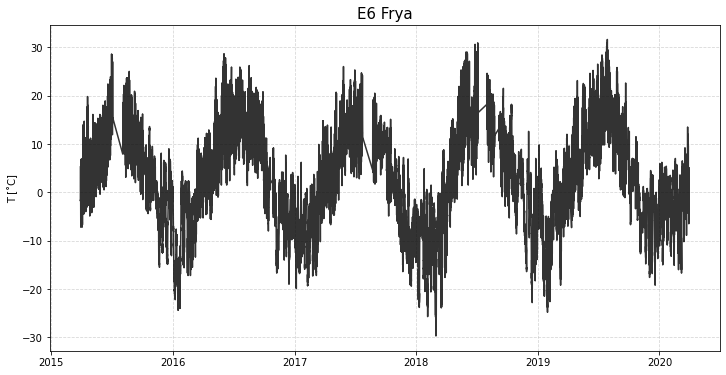

In [ ]:
plt.figure(figsize=(12,6))
plt.title('E6 Frya', size=15)
plt.ylabel('T [˚C]')
plt.plot(df_G.date, df_G.DL3_T, c='black', alpha=0.8)
plt.grid(ls='dashed', alpha=0.5)

In [17]:
df_DL1_cut = prepare_data("Ringebu_DL1_cut.csv")

# Select heading points
index_heat  = df_DL1_cut['T'].index[df_DL1_cut['T'].apply(np.isnan)]
index = np.setdiff1d(np.arange(1,len(df_DL1)+1), index_heat)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2822: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


## Thermal ellipse

Finally, we can develop the concept of *Thermal Ellipse*, which will be useful in the second notebook in order to assess the performance of the proposed models. By plotting the internal temperature versus the external one, we observe data distributing as an ellipse-like profile. This ellipse represents the thermal inertia of the church's walls, without whom the internal temperature would strictly follow the external one.

The orange points are those that metadata label as "heating", and it is possible to see how they tend to lay outside the thermal ellipse region.

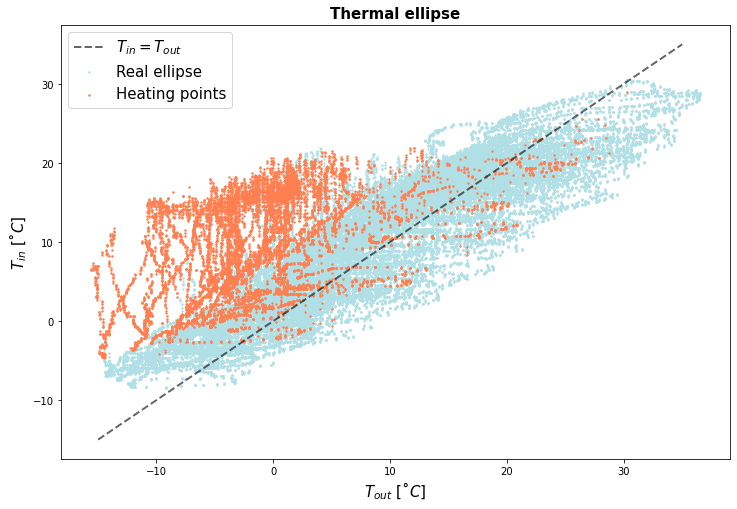

In [18]:
plt.figure(figsize=(12,8))
plt.title('Thermal ellipse', fontweight='bold', size=15)
plt.ylabel(r'$T_{in}~[˚C]$', size=15)
plt.xlabel(r'$T_{out}~[˚C]$', size=15)
plt.scatter(df_DL3['T'][index], df_DL1['T'][index], c='powderblue', label='Real ellipse', s=2)
plt.scatter(df_DL3['T'][index_heat],  df_DL1['T'][index_heat], c='coral', label='Heating points', s=2)
plt.plot(np.linspace(-15, 35, 10), np.linspace(-15, 35, 10), ls='dashed', c='black', lw=2, alpha=0.6, label=r'$T_{in} = T_{out}$')
plt.legend(fontsize=15, loc='best');

*These two cells are useful for the notebook 2, where we need to compute the TE score*

In [19]:
# real ellipse parameters
def get_param(x,y):
  cov = np.cov(x, y)
  mean_x = np.mean(x)
  mean_y = np.mean(y)
  return([mean_x,mean_y], cov)

mu_TE, sigma_TE = get_param(df_DL3['T'][index], df_DL1['T'][index])

print('Mean:', mu_TE)
print('Covariance matrix:\n', sigma_TE)

Mean: [7.347071732125886, 9.112060973913035]
Covariance matrix:
 [[88.00106814 71.62624662]
 [71.62624662 69.42929521]]


In [92]:
# tensorflow TE_score and l2_score implementation

import tensorflow as tf
import tensorflow_probability as tfp

# mean, standard deviation matrix estimated from the data
pdf_TE = tfp.distributions.MultivariateNormalFullCovariance(loc=mu_TE, covariance_matrix=sigma_TE)

#tf.gather(rec, [1, 2], axis=1)

@tf.function
def compute_TE_score(rec):
    temps = tf.cast(tf.stack(rec, axis=1), dtype=tf.float64)
    return tf.reduce_mean(-pdf_TE.log_prob(temps))

print('Baseline TE score: ', compute_TE_score([df_DL3['T'][index], df_DL1['T'][index]]).numpy())

Baseline TE score:  6.281404291485464
